

# image colorization 



## instal and import libraries
there are five python files (load_data.py , uNet.py, critic.py, wGangp_train_loop.py, data_IS.py ) , upload them to session storage.

In [1]:
pip install torchdata

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 44.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 18.0 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urllib3-1.24.3:
      Successfully uninstalled urllib3-1.24.3


In [2]:
pip install torchmetrics[image]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 517.2/517.2 KB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 KB 5.2 MB/s eta 0:00:00


In [3]:
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torchvision.transforms import functional
from torchvision.transforms import Resize

from torch.utils.data import Dataset, DataLoader
import torch.autograd as autograd
import time as time
import numpy as np
from IPython import display
from torchdata.datapipes.iter import FileLister
from PIL import Image
from skimage import color

import torchvision.models
import random
from skimage.color import rgb2lab, lab2rgb

from load_data import data
from uNet import U_net,weights_init
from critic import critic
from wGangp_train_loop import train, generate_images


In [4]:
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

## Loading data

we use ImageNet 1000 (mini) and COCO datasets.
for ImageNet 1000 (mini) you can download it directly from https://www.kaggle.com/datasets/ifigotin/imagenetmini-1000

we also prepared a sharelink from google dive: https://drive.google.com/drive/folders/1o2ND_QksrmrXlFeGZu_Hfy9-dTo_J3vx?usp=sharing Add a shortcut to your own google drive and mount drive on google colab. this way you should be able to access the dataset and make sure dataset = "imagenet". 

for COCO dataset just put dataset = "coco".



In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
#### coco dataset
dataset = "coco"
###  imagenet dataset
# dataset = "imagenet"

saving = [False, False] #after first run, change both to False,
                        #(it works just for imageset dataset, if you use coco do not change)
number_of_data= [6650,370] #[number of training dataset, number of validation and test dataset] 
batch_size = [16,1] #[batch size of train set, batch size of validation set]
data_train, data_val, val_visual, data_test = data(number_of_data, saving, batch_size, dataset)

print(len(data_train))
print(len(data_val))
print(len(val_visual))
print(len(data_test))

415
350
350
20


## Unet and patchGAN

In [7]:
generator = U_net()
generator.apply(weights_init)

U_net(
  (l1): downsample(
    (model): Sequential(
      (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l2): downsample(
    (model): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l3): downsample(
    (model): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l4): downsample(
    (model): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_ru

In [8]:
from torchsummary import summary
generator.to(device)
summary(generator, input_size=(1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,024
         LeakyReLU-2         [-1, 64, 128, 128]               0
        downsample-3         [-1, 64, 128, 128]               0
            Conv2d-4          [-1, 128, 64, 64]         131,072
       BatchNorm2d-5          [-1, 128, 64, 64]             256
         LeakyReLU-6          [-1, 128, 64, 64]               0
        downsample-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 256, 32, 32]         524,288
       BatchNorm2d-9          [-1, 256, 32, 32]             512
        LeakyReLU-10          [-1, 256, 32, 32]               0
       downsample-11          [-1, 256, 32, 32]               0
           Conv2d-12          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-13          [-1, 512, 16, 16]           1,024
        LeakyReLU-14          [-1, 512,

In [9]:
wg_critic = critic()
wg_critic.apply(weights_init)

critic(
  (l1): downsample_c(
    (model): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LayerNorm((64, 128, 128), eps=1e-05, elementwise_affine=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l2): downsample_c(
    (model): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LayerNorm((128, 64, 64), eps=1e-05, elementwise_affine=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l3): downsample_c(
    (model): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LayerNorm((256, 32, 32), eps=1e-05, elementwise_affine=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (l4): ZeroPad2d((1, 1, 1, 1))
  (l5): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplac

In [10]:
wg_critic.to(device)
summary(wg_critic, input_size=[(1, 256, 256),(2, 256, 256)])

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,072
         LayerNorm-2         [-1, 64, 128, 128]       2,097,152
         LeakyReLU-3         [-1, 64, 128, 128]               0
      downsample_c-4         [-1, 64, 128, 128]               0
            Conv2d-5          [-1, 128, 64, 64]         131,072
         LayerNorm-6          [-1, 128, 64, 64]       1,048,576
         LeakyReLU-7          [-1, 128, 64, 64]               0
      downsample_c-8          [-1, 128, 64, 64]               0
            Conv2d-9          [-1, 256, 32, 32]         524,288
        LayerNorm-10          [-1, 256, 32, 32]         524,288
        LeakyReLU-11          [-1, 256, 32, 32]               0
     downsample_c-12          [-1, 256, 32, 32]               0
        ZeroPad2d-13          [-1, 256, 34, 34]               0
           Conv2d-14          [-1, 512,

## Training

In [11]:
gen_opt = torch.optim.Adam(generator.parameters(), lr=1e-4, betas=(0, 0.9))
critic_opt = torch.optim.Adam(wg_critic.parameters(), lr=1e-4, betas=(0, 0.9))

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 3730 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


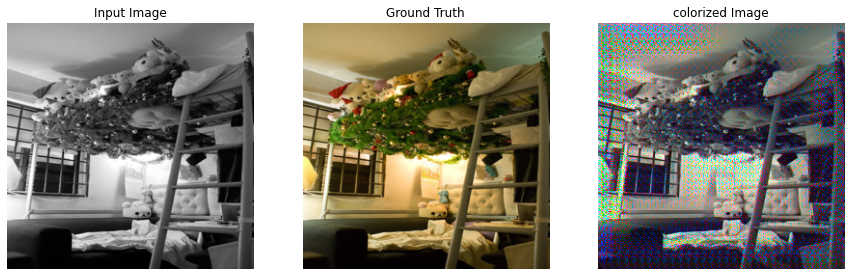

Time for epoch 1 is 172.38257241249084 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 209 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


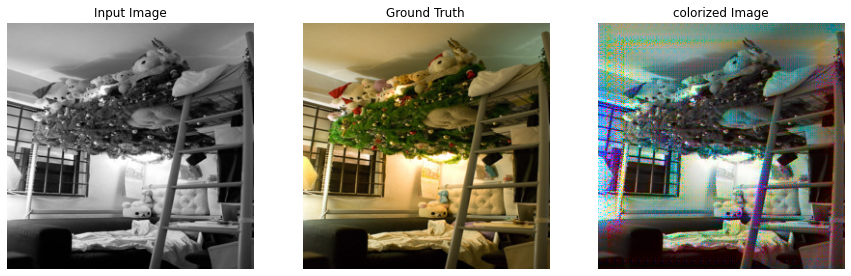

Time for epoch 6 is 171.24617767333984 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 200 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


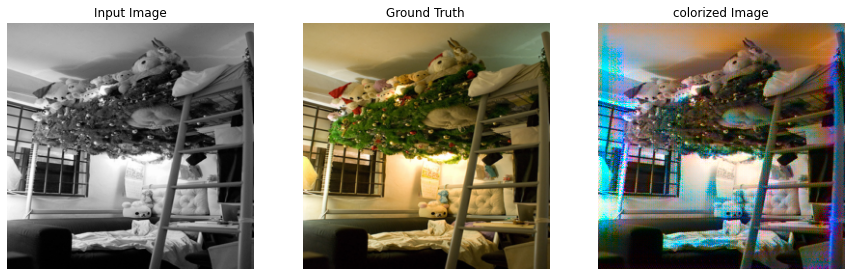

Time for epoch 11 is 171.40895414352417 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 15 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


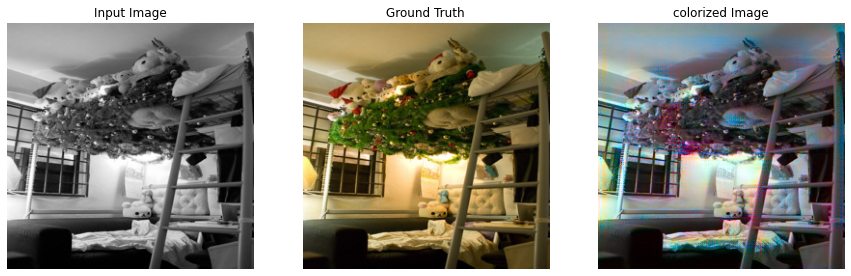

Time for epoch 16 is 171.03991866111755 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 248 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


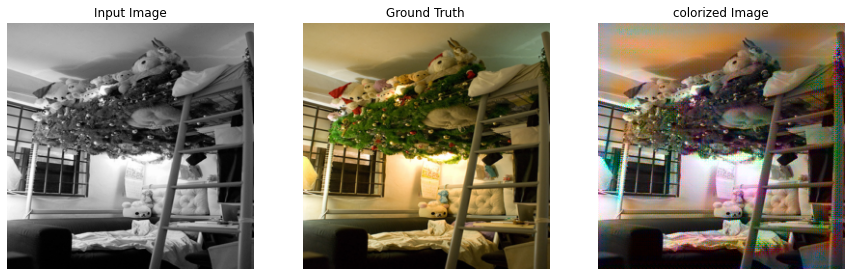

Time for epoch 21 is 171.31527376174927 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 95 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


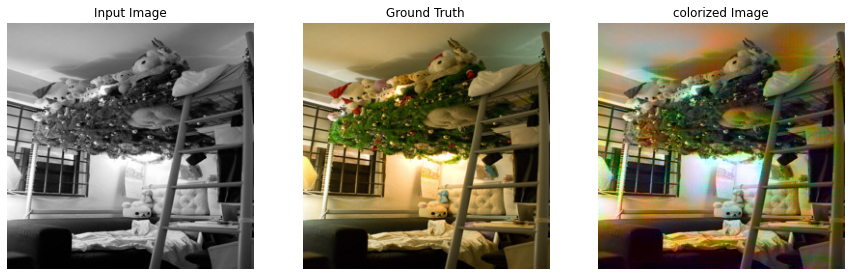

Time for epoch 26 is 171.07816529273987 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 5 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


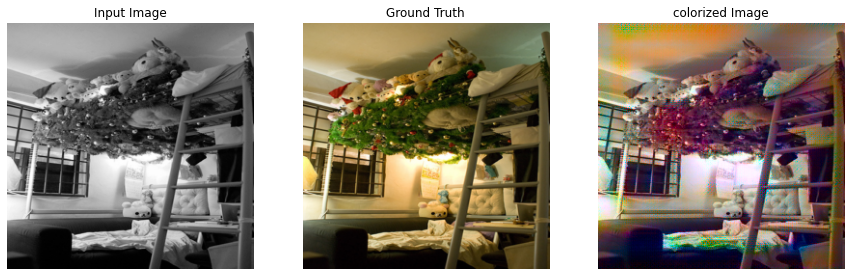

Time for epoch 31 is 171.32097005844116 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 79 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


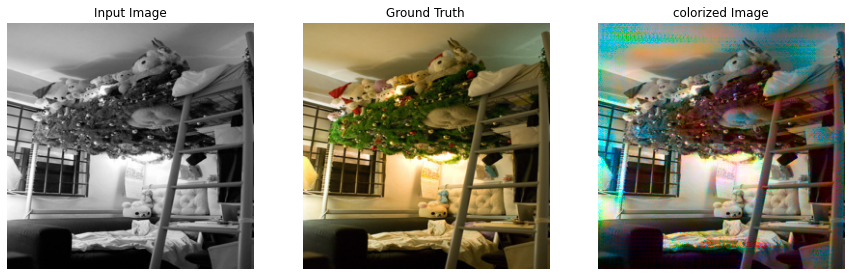

Time for epoch 36 is 171.2538402080536 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 161 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


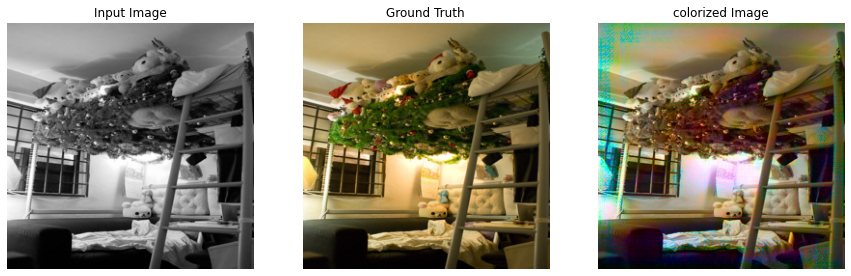

Time for epoch 41 is 171.2194287776947 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 97 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


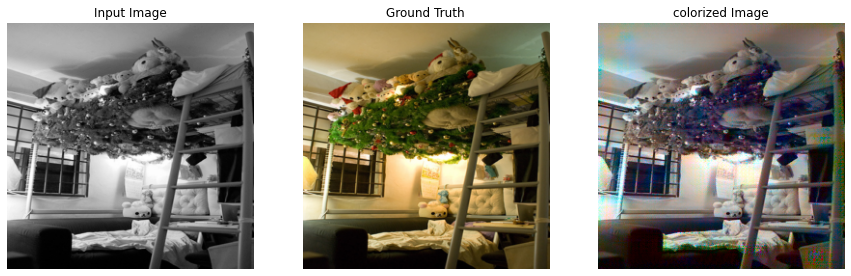

Time for epoch 46 is 171.08847379684448 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 519 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


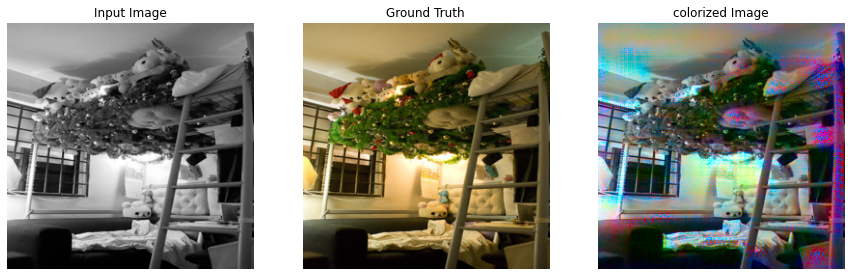

Time for epoch 51 is 171.22301292419434 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 803 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


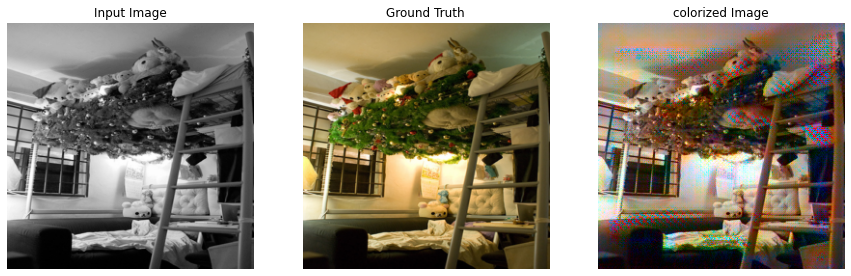

Time for epoch 56 is 171.21584343910217 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 108 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


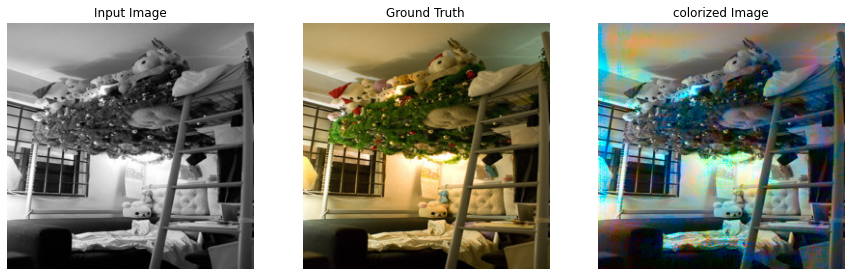

Time for epoch 61 is 171.39888787269592 sec


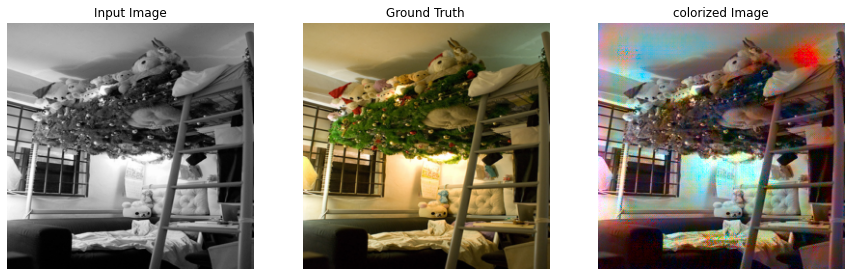

Time for epoch 66 is 171.4180290699005 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 155 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


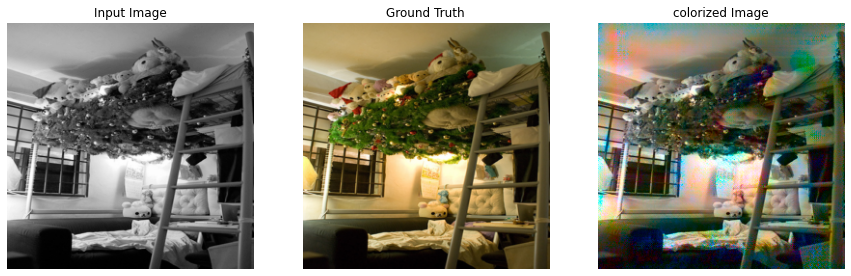

Time for epoch 71 is 171.45789074897766 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 394 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


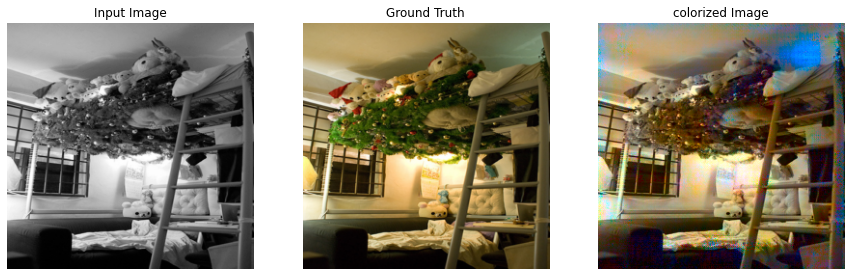

Time for epoch 76 is 171.38206601142883 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 2746 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


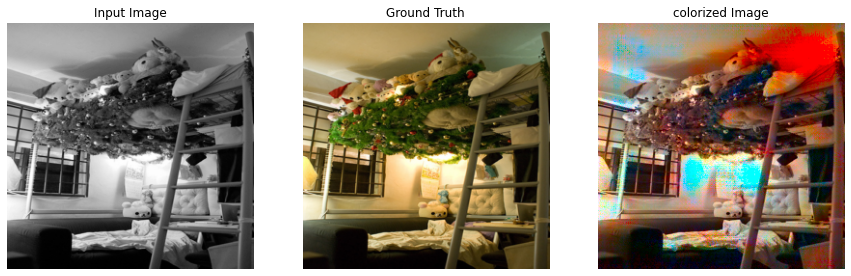

Time for epoch 81 is 171.4003586769104 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 370 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


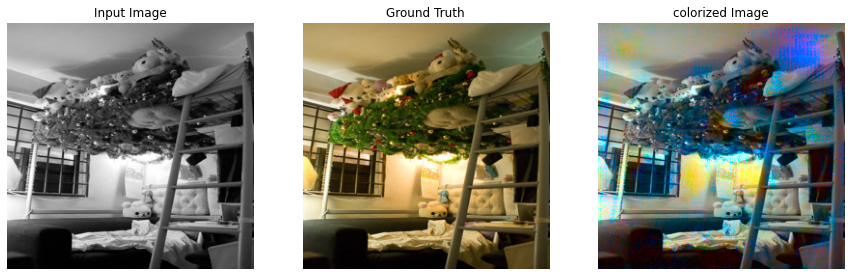

Time for epoch 86 is 171.34185600280762 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 168 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


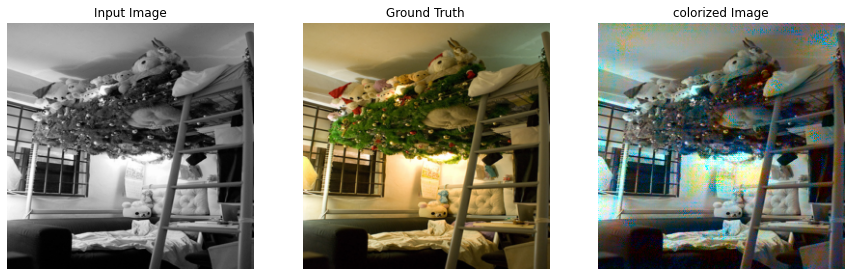

Time for epoch 91 is 171.71001291275024 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 258 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


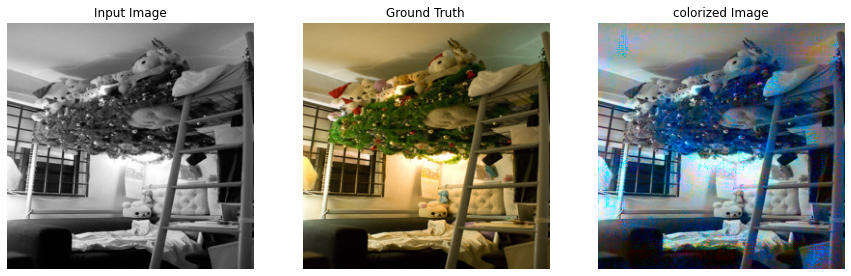

Time for epoch 96 is 171.45205211639404 sec


/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 357 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


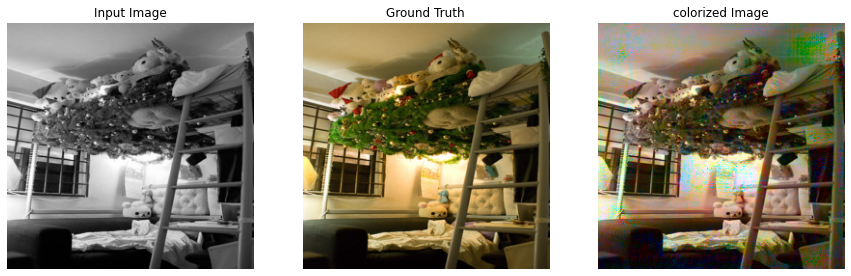

Total runtime for 100 epoches is 17087.13502216339 sec


In [12]:
epochs = 100
gloss_train, dloss_train, gloss_valid, dloss_valid = train(data_train, data_val, val_visual,
                                                            epochs,
                                                            generator,wg_critic, 
                                                            critic_opt, gen_opt,device)

## Evaluation
check the grnerator and discriminator losses and the overfit

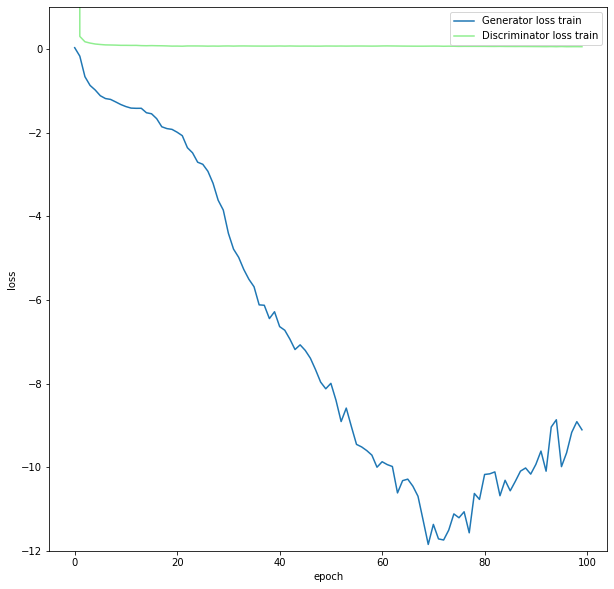

<Figure size 432x288 with 0 Axes>

In [18]:
### Generator and Discriminator losses

plt.figure(figsize=(10,10))
plt.plot(gloss_train, label="Generator loss train")
plt.plot(dloss_train, label="Discriminator loss train",color ='lightgreen')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.ylim([-12,1])
plt.legend()
plt.show()
plt.savefig('G_D_l.png')

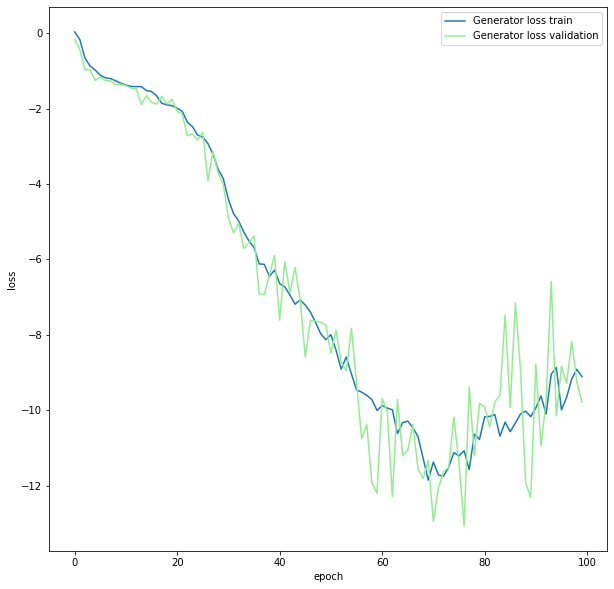

<Figure size 432x288 with 0 Axes>

In [19]:
### Generator losse for train and validation

plt.figure(figsize=(10,10))
plt.plot(gloss_train, label="Generator loss train")
plt.plot(gloss_valid, label="Generator loss validation",color ='lightgreen')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend()
plt.show()
plt.savefig('G_tv_l.png')

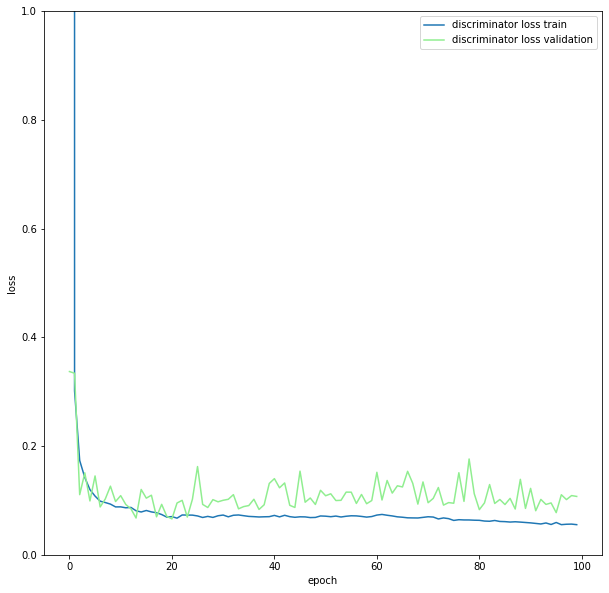

<Figure size 432x288 with 0 Axes>

In [20]:
### Discriminator losse for train and validation

plt.figure(figsize=(10,10))
plt.plot(dloss_train, label="discriminator loss train")
plt.plot(dloss_valid, label="discriminator loss validation",color ='lightgreen')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.ylim([0,1])
plt.legend()
plt.show()
plt.savefig('D_tv_l.png')

## Test

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 42 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


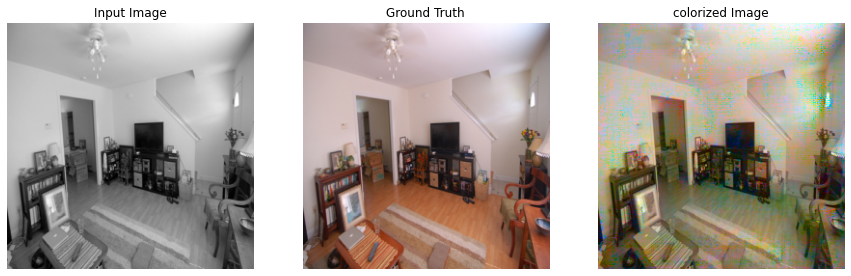

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 322 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


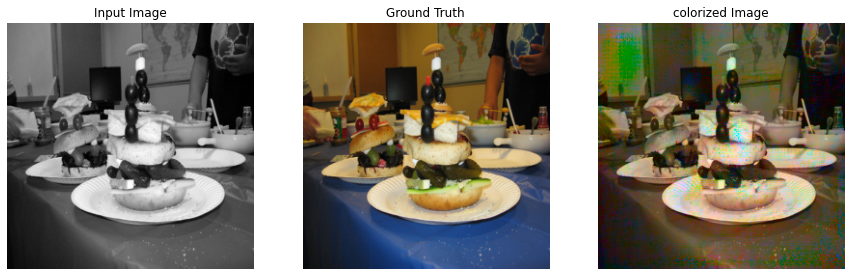

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 435 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


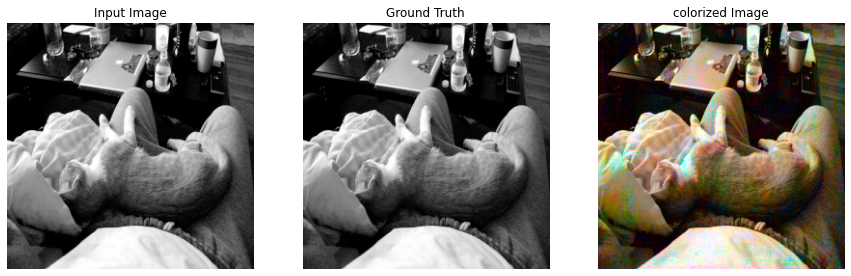

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 136 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


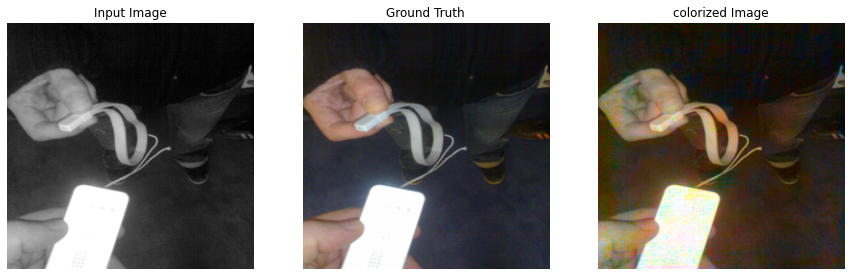

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 73 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


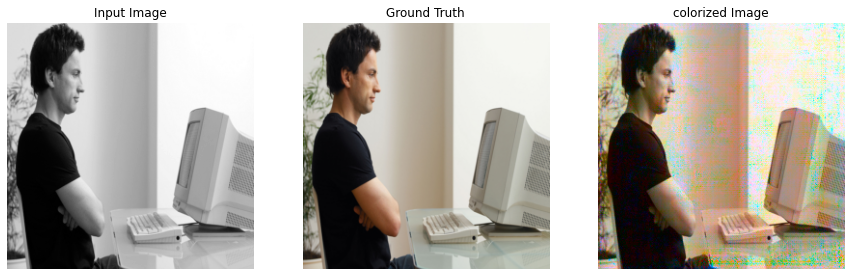

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 321 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


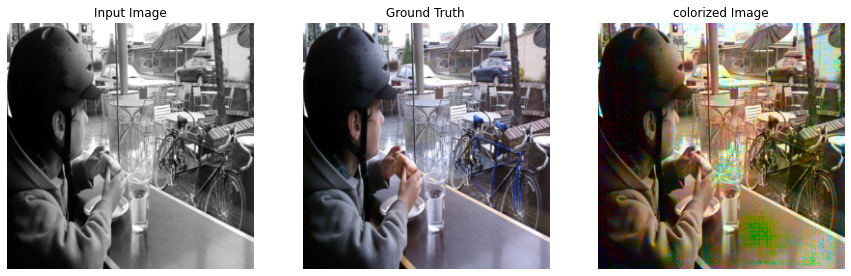

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 196 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


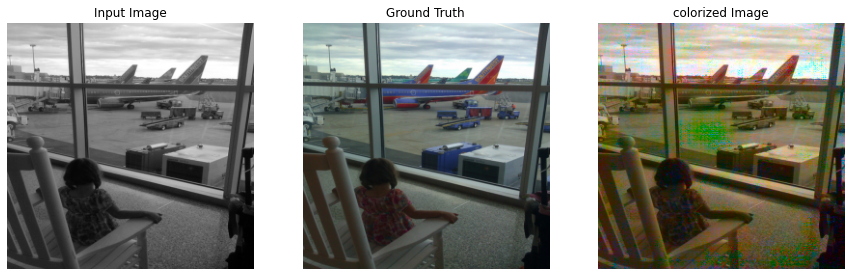

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 348 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


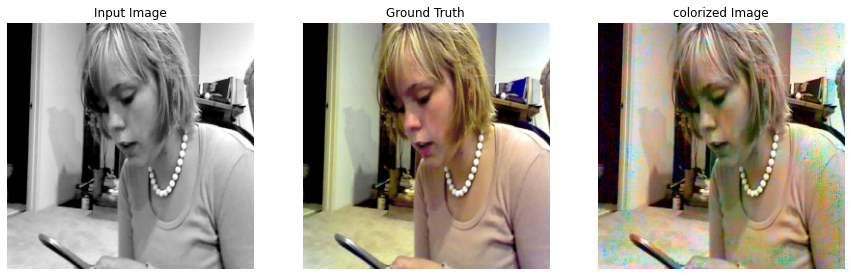

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 111 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


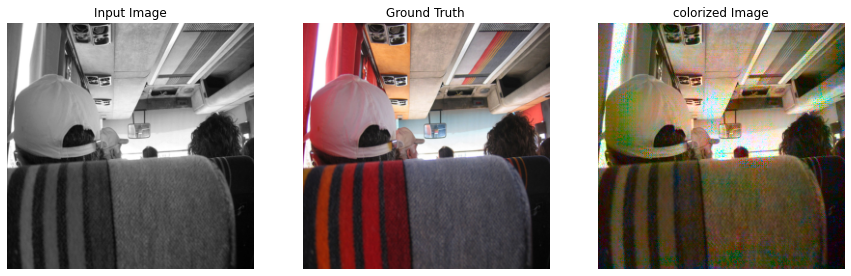

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 620 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


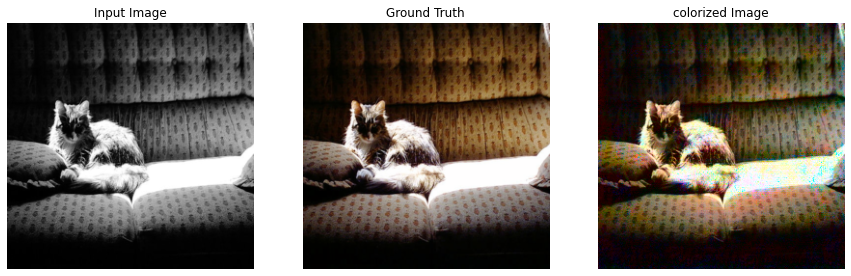

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 182 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


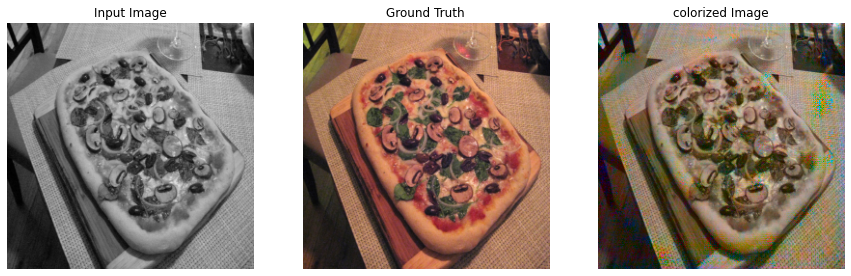

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 224 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


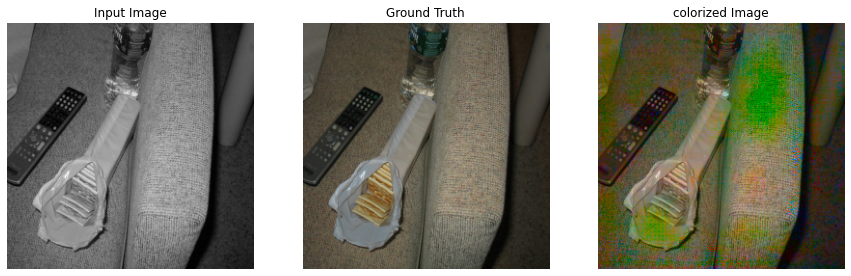

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 186 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


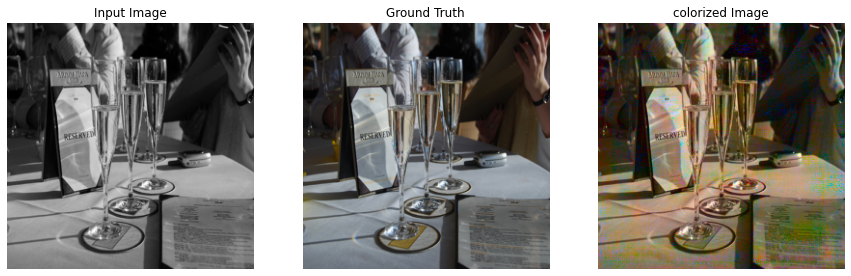

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 635 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


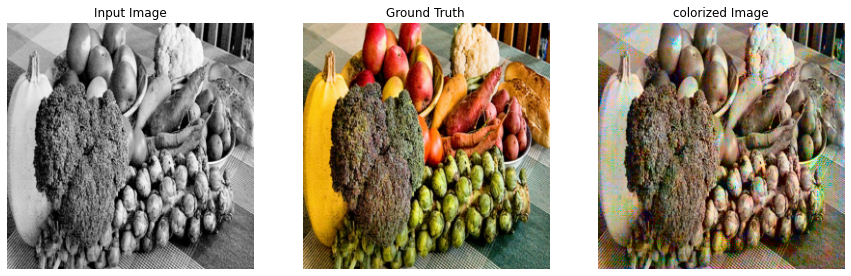

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 23 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


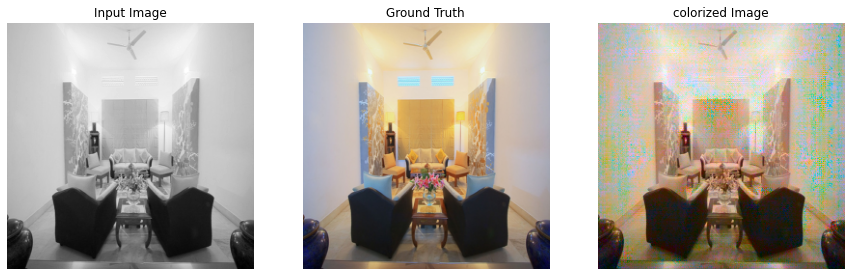

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 360 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


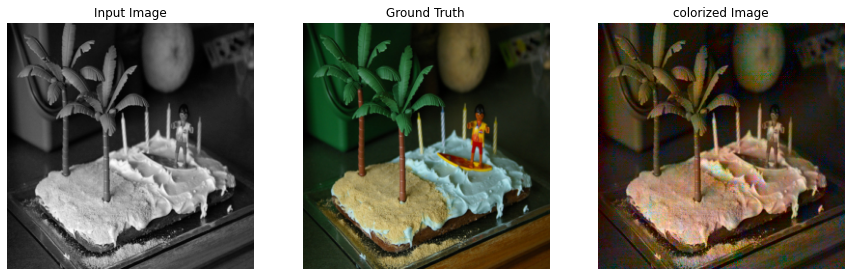

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 536 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


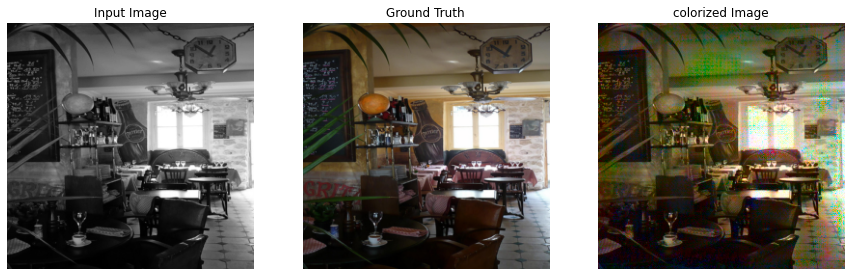

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 13 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


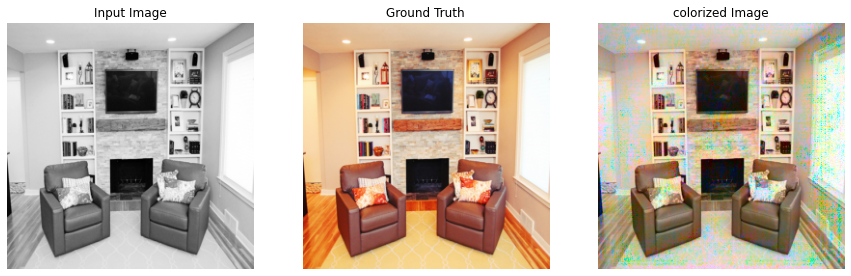

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 513 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


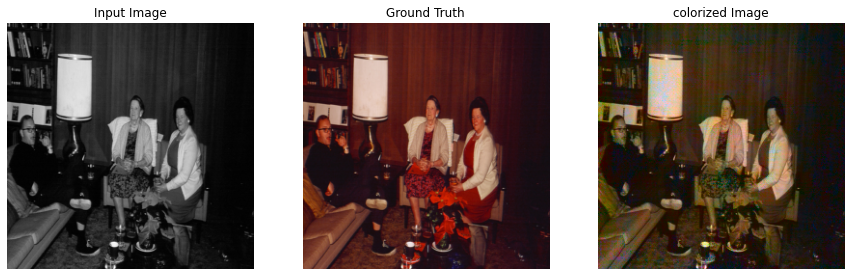

/usr/local/lib/python3.8/dist-packages/skimage/color/colorconv.py:1109: UserWarning: Color data out of range: Z < 0 in 264 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


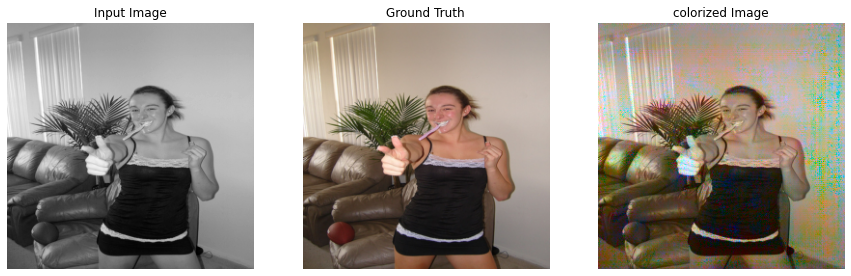

In [21]:
### getting fake image for test

num = 200
for input_test, target_test in data_test:
  num = num+1
  generate_images(generator, input_test, target_test, num, device)